In [4]:
import sys  
sys.path.insert(1, '../src')

from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

from skimage.morphology import local_maxima

from utils.tps_io import parse_tps
# from UNet_class_and_functions import *

from tqdm.auto import tqdm
tqdm.pandas()

In [ ]:
PROJECT_ROOT = Path.cwd().parent

LOGS_ROOT = PROJECT_ROOT / 'src' / 'out' / 'wing_extraction'
LOGS_PATH = LOGS_ROOT / 'organized_wings_log.csv'

MODEL_DIR = PROJECT_ROOT / 'data' / 'models' / 'best_model'

METADATAS_OUT = PROJECT_ROOT / 'data' / 'annotations' / 'gabriel.csv'
LANDMARKS_OUT = PROJECT_ROOT / 'data' / 'annotations' / 'gabriel.tps'

print(f'Racine du projet : {PROJECT_ROOT}')

Racine du projet : c:\Users\Jules\Documents\IEES\idmybee


## Données Tancrède

In [22]:
tps_tancrede = '../data/annotations/tancrede.tps'
specimens, _ = parse_tps(tps_tancrede)

In [26]:
ds = []
records = []

for spec in specimens:
    img_path = spec.image_path

    name =  Path(img_path).stem
    app = name.split('_')[-1]

    tmp = img_path.split("/")
    espece = tmp[-3].split('_')[-1]
    caste = tmp[-2]

    ds.append(
        {"name": name, "espece": espece, "caste": caste, "device": app}
    )

    records.append({
        "landmarks": spec.landmarks[2:5,:],
        "image_path": img_path,
        "specimen_id": spec.sid,
    })

df = pd.DataFrame(ds)
df = df.drop(df[df.espece == "terrain"].index)
df.to_csv('../data/annotations/tancrede.csv', index_label="id")

In [28]:
specimens[0].landmarks.shape

(19, 2)

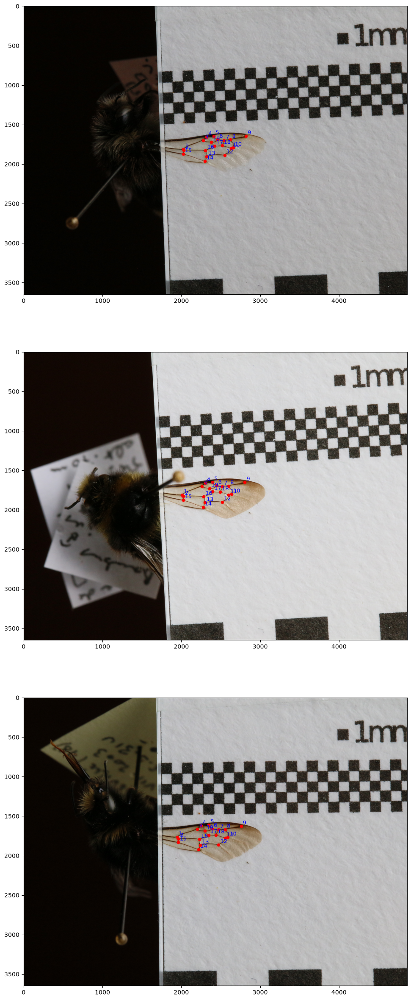

In [ ]:
n = 3
fig, axes = plt.subplots(n, 1, figsize=(15, 10*n))

for i, spec in enumerate(specimens[:n]):
    image = cv2.imread(PROJECT_ROOT / spec.image_path)
    h, w = image.shape[:2]

    landmarks = spec.landmarks.copy()
    landmarks[:, 1] = h - landmarks[:, 1]

    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].scatter(landmarks[:,0], landmarks[:,1], 20, 'r')

    for j, (x, y) in enumerate(landmarks):
        axes[i].annotate(str(j + 1), (x, y), color="blue", fontsize=9,
            xytext=(3, 3), textcoords="offset points")

plt.show()

## Modèle Gabriel

In [63]:
wing_crops = pd.read_csv(LOGS_PATH)
wing_crops.head()

,id,image,status,x,y,w,h,theta,confidence,similarity,aspect_ratio,n_detections,input_path,output_path
0,0,FR15_ABOM07082020038_P1.JPG,OK,2489.0,1746.0,470.0,1111.0,0.0,0.750,0.925,2.36,4,data\images\wide\organized\Bombus_confusus\mal...,data\images\crop\organized\Bombus_confusus\mal...
1,1,FR15_ABOM07082020038_P2.JPG,OK,2484.0,1812.0,451.0,1111.0,0.0,0.893,0.933,2.46,2,data\images\wide\organized\Bombus_confusus\mal...,data\images\crop\organized\Bombus_confusus\mal...
2,2,FR15_ABOM07082020038_S1.jpg,OK,1179.0,1872.0,453.0,1083.0,0.0,0.841,0.893,2.39,2,data\images\wide\organized\Bombus_confusus\mal...,data\images\crop\organized\Bombus_confusus\mal...
3,3,FR15_ABOM07082020038_S2.jpg,OK,1045.0,1920.0,453.0,1067.0,0.0,0.790,0.894,2.36,2,data\images\wide\organized\Bombus_confusus\mal...,data\images\crop\organized\Bombus_confusus\mal...
4,4,FR15_ABOM07082020038_S3.jpg,OK,1116.0,1880.0,437.0,1020.0,0.0,0.902,0.903,2.33,2,data\images\wide\organized\Bombus_confusus\mal...,data\images\crop\organized\Bombus_confusus\mal...


In [66]:
def fix_image(row):
    return Path(row["image"]).stem

def get_species(row):
    try:
        sp = row["input_path"].split('\\')[-3].split('_')[1]
    except:
        sp = row["input_path"].split('\\')[-3]
    return sp

def get_caste(row):
    return row["input_path"].split('\\')[-2]

def get_device(row):
    return row["image"].split('_')[-1]

valids = wing_crops.loc[wing_crops.status == 'OK']
valids["image"] = valids.apply(fix_image, axis=1)
valids["espece"] = valids.apply(get_species, axis=1)
valids["caste"] = valids.apply(get_caste, axis=1)
valids["device"] = valids.apply(get_device, axis=1)

# unkown = valids[~valids.caste.isin(["male", "queen", "worker"])]
valids = valids[valids.caste.isin(["male", "queen", "worker"])].reset_index()
# valids[["image", "espece", "caste", "device"]].to_csv(METADATAS_OUT, index_label="id") 

In [8]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

model_name = "UNet_150_epoch_lr=0.001_seed=58_func=pow_param=30"
model_load = torch.load(MODEL_DIR / (model_name + '.pth'),
                        weights_only=False, map_location=device)
model_load.to(device)
model_load.eval()

print("using", device)

using cuda


In [9]:
records = []
total = valids.shape[0]

for i, row in tqdm(valids.iterrows(), total=total):
    path = PROJECT_ROOT / row.output_path

    crop = cv2.imread(path)
    crop = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)

    crop_t = torch.Tensor(crop.transpose(2,0,1)/255).unsqueeze(0)
    crop_t = crop_t.to(device)

    output = model_load(crop_t).cpu().squeeze(0).detach().numpy().transpose(1,2,0)
    output = output.squeeze(axis = 2)

    maximas = np.argwhere(local_maxima(output) == True)
    
    scores = np.array([output[pt[0],pt[1]] for pt in maximas])
    sorter = np.argsort(scores)
    
    maximas = maximas[sorter,:]
    maximas = maximas[-18:,:]

    records.append({
        "landmarks": maximas,
        "image_path": path,
        "specimen_id": i,
    })

  0%|          | 0/2731 [00:00<?, ?it/s]

In [10]:
with open(LANDMARKS_OUT, "w", encoding="utf-8") as f:
    for rec in records:
        lm = rec["landmarks"]
        f.write(f"LM={len(lm)}\n")
        for y, x in lm:
            f.write(f"{x:.4f} {y:.4f}\n")
        f.write(f"IMAGE={rec['image_path']}\n")
        f.write(f"ID={rec['specimen_id']}\n")

In [12]:
sample_indices = np.random.choice(total, size=min(10, total), replace=False)

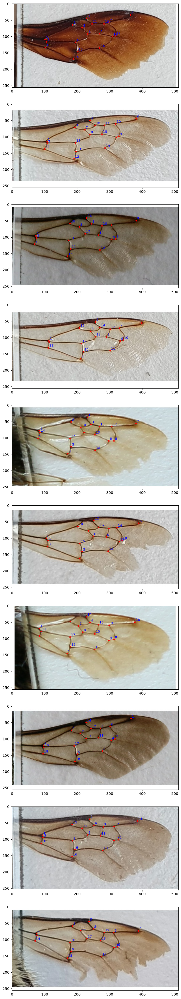

In [13]:
fig, axes = plt.subplots(10, 1, figsize=(10, 50))

for i, idx in enumerate(sample_indices):
    d = records[idx]
    
    image = cv2.imread(d["image_path"])
    landmarks = d["landmarks"]

    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].scatter(landmarks[:,1], landmarks[:,0], 10, 'r')

    for j, (y, x) in enumerate(landmarks):
        axes[i].annotate(str(j + 1), (x, y), color="blue", fontsize=9,
            xytext=(3, 3), textcoords="offset points")

plt.show()

In [22]:
outliers = pd.read_csv(PROJECT_ROOT / 'src' / 'out' / 'outlier_specimens.csv', index_col=0)
outliers_idx = outliers[outliers.heavy].index

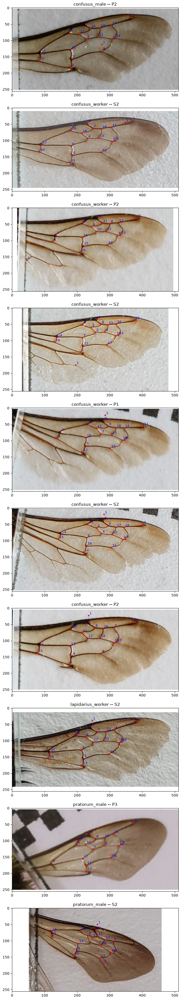

In [36]:
fig, axes = plt.subplots(10, 1, figsize=(10, 50))

for i, idx in enumerate(outliers_idx[:10]):
    d = records[idx]

    img_path = Path(d["image_path"])
    
    image = cv2.imread(img_path)
    landmarks = d["landmarks"]

    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].scatter(landmarks[:,1], landmarks[:,0], 10, 'r')

    for j, (y, x) in enumerate(landmarks):
        axes[i].annotate(str(j + 1), (x, y), color="blue", fontsize=9,
            xytext=(3, 3), textcoords="offset points")
    
    esp = img_path.parents[1].stem.split("_")[-1]
    cst = img_path.parents[0].stem
    device = Path(img_path).stem.split("_")[-1]
    axes[i].set_title(f"{esp}_{cst} -- {device}")

plt.show()

In [104]:
datas = pd.read_csv(PROJECT_ROOT / 'data' / 'annotations' / 'gabriel.csv', index_col=0)
preds = pd.read_csv(PROJECT_ROOT / 'src' / 'out' / 'predictions.csv', index_col=0)

In [105]:
X = datas.loc[preds.index, ['espece']]
y = preds.loc[:, ['predicted_espece', 'second_choice']]

In [106]:
top1 = X['espece'].isin(y['predicted_espece'])
top2 = top1 | X['espece'].isin(y['second_choice'])

top1_accuracy = top1.sum() / len(X)
print(f"Top-1 Accuracy: {top1_accuracy:.4f} ({top1_accuracy*100:.2f}%)")
top2_accuracy = top2.sum() / len(X)
print(f"Top-2 Accuracy: {top2_accuracy:.4f} ({top2_accuracy*100:.2f}%)")

Top-1 Accuracy: 1.0000 (100.00%)
Top-2 Accuracy: 1.0000 (100.00%)


In [110]:
y[['predicted_espece', 'second_choice']].values

array([['confusus', 'monticola'],
       ['confusus', 'monticola'],
       ['confusus', 'monticola'],
       ...,
       ['wurflenii', 'sichelii'],
       ['wurflenii', 'lapidarius'],
       ['wurflenii', 'sichelii']], shape=(2681, 2), dtype=object)

In [118]:
# Créer un dataframe de comparaison
comparison = pd.DataFrame({
    'true_espece': X['espece'],
    'predicted_espece': y['predicted_espece'],
    'second_choice': y['second_choice'],
    'top1_match': X['espece'] == y['predicted_espece']
})
comparison['top2_match'] = (comparison['true_espece'] == comparison['predicted_espece']) | \
                           (comparison['true_espece'] == comparison['second_choice'])

# Afficher les résultats
print("=== RÉSUMÉ DES PRÉDICTIONS ===")
# Résumé des accuracies
top1_accuracy = comparison['top1_match'].sum() / len(comparison)
top2_accuracy = comparison['top2_match'].sum() / len(comparison)

print(f"Top-1 Accuracy: {top1_accuracy:.4f} ({top1_accuracy*100:.2f}%)")
print(f"Top-2 Accuracy: {top2_accuracy:.4f} ({top2_accuracy*100:.2f}%)")

# Afficher les erreurs (top1_match == False)
# Afficher les erreurs (top1_match == False)
print(f"\n=== ERREURS TOP-1 ({(~comparison['top1_match']).sum()} erreurs) ===")
print(comparison[~comparison['top1_match']].head(10))

print(f"\n=== ERREURS TOP-2 ({(~comparison['top2_match']).sum()} erreurs) ===")
print(comparison[~comparison['top2_match']].head(10))

=== RÉSUMÉ DES PRÉDICTIONS ===
Top-1 Accuracy: 0.9168 (91.68%)
Top-2 Accuracy: 0.9545 (95.45%)

=== ERREURS TOP-1 (223 erreurs) ===
    true_espece predicted_espece second_choice  top1_match  top2_match
id                                                                    
61     confusus        wurflenii      pratorum       False       False
113    confusus        wurflenii      pratorum       False       False
138    confusus       soroeensis     monticola       False       False
140    confusus        wurflenii      pratorum       False       False
143    confusus        wurflenii      pratorum       False       False
146    confusus        wurflenii      pratorum       False       False
195    confusus       lapidarius      sichelii       False       False
209  lapidarius        wurflenii    lapidarius       False        True
210  lapidarius         sichelii    lapidarius       False        True
216  lapidarius        monticola     pyrenaeus       False       False

=== ERREURS TOP